# How to prepare data?

See [this gist](https://gist.github.com/EmanuelKuhn/bc499b90c715907e3c12e2e484fe2945) for instructions and python scripts.

# Open google drive data folder

In [1]:
loaded_drive = False
def open_drive_folder(FOLDERNAME):
  global loaded_drive
  if not loaded_drive:
  
    loaded_drive = True

    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # enter the foldername in your Drive where you have saved the assignment example
    # notebook and data, e.g. 'CS3542TU_CNN/'

  assert FOLDERNAME is not None, "[!] Enter the foldername."

  # now that we've mounted your Drive, this ensures that
  # the Python interpreter of the Colab VM can load
  # python files from within it.
  import sys
  sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

  # this downloads the CIFAR-10 dataset to your Drive
  # if it doesn't already exist.
  %cd drive/My\ Drive/$FOLDERNAME/

FOLDERNAME = 'data'
open_drive_folder(FOLDERNAME)

Mounted at /content/drive
/content/drive/MyDrive/dl-reproduction-project/data


# Imports

In [2]:
%%capture
# generic modules
import datetime, os
import itertools
import time

import datetime
from typing import Tuple

import pandas as pd
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
#

# append working folder
import sys
working_folder = '/content/drive/My Drive/data' #path where we have csv data
sys.path.append(working_folder)  #

# basic data science modules
import numpy as np
import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters() 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from typing import *

#

!pip install pytorch_forecasting

import pytorch_forecasting

import torch.optim as optim

import collections # OrderedDict
import matplotlib.pyplot as plt


# Pricing data

## Price Dataloader

In [3]:
import datetime
from typing import Tuple

import pandas as pd
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader


class PricesDataset(Dataset):
    """ dataset."""

    def __init__(self, dfPrices, dfWeather, included_input_features: List[str], name: str):
        self.examples: OrderedDict = PricesDataset.create_examples(start=datetime.datetime.combine(dfPrices.iloc[48].name.date(), datetime.time(0)),
                                                      end=dfPrices.iloc[-1].name,
                                                      dfPrices=dfPrices,
                                                      dfWeather=dfWeather,
                                                      included_input_features=included_input_features)
        
        self.name = name

    def __len__(self):
        return len(self.examples)
    
    def __getitem__(self, idx):
        return self.examples[list(self.examples.keys())[idx]]

    # The method where feature engineering can be done
    @staticmethod
    def create_example(target_date: datetime.date, dfPrices, dfWeather, included_input_features):
        # possible features: ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

        # No data after this point should be used as input feature
        last_available_start_time = target_date - datetime.timedelta(hours=13)
        last_available_time = target_date - datetime.timedelta(hours=12, minutes=59)

        # Define start and end of prediction horizon
        # Only the 24h of the target day should be predicted
        first_target_start_time = target_date + datetime.timedelta(hours=0)
        last_target_start_time = target_date + datetime.timedelta(hours=23)

        last_available_24_hours = pd.date_range(
            last_available_start_time - datetime.timedelta(hours=23),
            last_available_start_time,
            freq="H"
        )

        target_datetimes = pd.date_range(first_target_start_time, last_target_start_time, freq="H")

        # print(f"target_datetimes: {target_datetimes}")
        
        target_week_days = list(map(lambda dt: dt.weekday(), target_datetimes))
        target_hours = list(map(lambda dt: dt.time().hour, target_datetimes))

        previous_prices = dfPrices.reindex(last_available_24_hours.values)["Day-ahead Price [EUR/MWh]"]

        prev_24h_cloud_cover = dfWeather.reindex(last_available_24_hours.values)["cloudcover"]

        prev_24h_windspeedKmph = dfWeather.reindex(last_available_24_hours.values)["windspeedKmph"]

        features = {}

        # all weather features:"tempC", "windspeedKmph", "cloudcover", "uvIndex"

        if "target_hour" in included_input_features:
          features["target_hour"] = F.one_hot(torch.tensor(target_hours), num_classes=24)
        
        if "target_week_day" in included_input_features:
          features["target_week_day"] = F.one_hot(torch.tensor(target_week_days), num_classes=7)

        if "prev_24h_prices" in included_input_features:
          features["prev_24h_prices"] = torch.unsqueeze(torch.Tensor(previous_prices.values), dim=1)
        
        if "prev_24h_cloud_cover" in included_input_features:
          features["prev_24h_cloud_cover"] = torch.unsqueeze(torch.Tensor(prev_24h_cloud_cover), dim=1)

        if "prev_24h_windspeedKmph" in included_input_features:
          features["prev_24h_windspeedKmph"] = torch.unsqueeze(torch.Tensor(prev_24h_cloud_cover), dim=1)


        assert set(included_input_features) == set(features.keys()), f"{set(included_input_features)} != {set(features.keys())}"

        targets = torch.Tensor(dfPrices.reindex(target_datetimes)["Day-ahead Price [EUR/MWh]"].values)

        features_tensor = torch.cat(tuple(features.values()), dim=1)

        assert not features_tensor.isnan().any()
        assert not targets.isnan().any()

        return features_tensor, targets

    @staticmethod
    def create_examples(start, end, dfPrices, dfWeather, included_input_features) -> OrderedDict:
        examples = OrderedDict()

        dates = pd.date_range(start, end, freq="D")

        for date in dates:
            assert date.time().hour == 0, date.time().hour

            try:
              examples[date] = PricesDataset.create_example(date, dfPrices, dfWeather, included_input_features)
            except AssertionError as e:
                print(f"skipping date: {date} because of an asssertion error while creating example")

                print(e)

        return examples


## Standardizer for dataframes

In [4]:
class Standardizer:
    def __init__(self):
        self.mean = None
        self.std = None

    def fit(self, df):
        self.mean = df.mean()
        self.std = df.std()

        return self

    def transform(self, df):
        return (df - self.mean) / self.std
    
    def reverse(self, series):
        return series * self.std + self.mean


## Data file loading:

In [5]:
def load_da_price_data(folder: str, year):
    assert folder.endswith("/")

    file_name = f'{folder}Day-ahead Prices_{year}01010000-{year + 1}01010000.csv'
    dfPrices_y = pd.read_csv(file_name, parse_dates=True)
    # dfPrices_y.index.name='MTU (CET)'

    start = dfPrices_y["MTU (CET)"].map(lambda x: x.split("-")[0])
    end = dfPrices_y["MTU (CET)"].map(lambda x: x.split("-")[1])

    dfPrices_y["start_datetime"] = pd.to_datetime(start, infer_datetime_format=True, dayfirst=True)
    dfPrices_y["end_datetime"] = pd.to_datetime(end, infer_datetime_format=True, dayfirst=True)

    dfPrices_y = dfPrices_y.set_index("start_datetime")

    # dfPrices_y = dfPrices_y[["end_datetime", "MTU (CET)", "Day-ahead Price [EUR/MWh]"]]
    dfPrices_y = dfPrices_y[["Day-ahead Price [EUR/MWh]"]]

    return dfPrices_y

def load_da_prices(folder, years):
    dfs = []

    for year in years:
        dfPrices = load_da_price_data(folder, year)

        # Remove duplicate entries
        dfPrices = dfPrices[~dfPrices.index.duplicated(keep='last')]

        dfs.append(dfPrices)

    return pd.concat(dfs)


def load_weather_data(folder: str, year):
    assert folder.endswith("/")

    file_name = f'{folder}Weather_{year}.csv'
    dfWeather_y = pd.read_csv(file_name, parse_dates=True)
    dfWeather_y["Date"] = pd.to_datetime(dfWeather_y["Date"], infer_datetime_format=True, dayfirst=True)
    dfWeather_y = dfWeather_y.set_index("Date")

    dfWeather_y = dfWeather_y[["tempC", "windspeedKmph", "cloudcover", "uvIndex"]]
    return dfWeather_y

def load_weather(folder, years):
    dfwdr = []

    for year in years:
        dfWeather = load_weather_data(folder, year)

        dfWeather = dfWeather[~dfWeather.index.duplicated(keep='last')]

        print(dfWeather)

        dfwdr.append(dfWeather)

    return pd.concat(dfwdr)

def split_train_validation(dfPrices, training_test_split_date) -> Tuple[pd.DataFrame, pd.DataFrame]:
    groups = dfPrices.groupby(by=lambda row: "train" if row <= training_test_split_date else "validation").groups

    train = dfPrices.reindex(groups["train"])
    validation = dfPrices.reindex(groups["validation"])

    return train, validation


## Actually Load Data

In [6]:
def load_data(years, number_of_validation_days):

  # price data files:
  folder = "dayahead_prices/"

  dfPrices = load_da_prices(folder, years)

  training_validation_split_date = dfPrices.iloc[-1].name.date() - datetime.timedelta(days=100)
  # print(f"training_validation_split_date: {training_validation_split_date}")

  train_prices, validation_prices = split_train_validation(dfPrices, training_validation_split_date)

  prices_standardizer = Standardizer().fit(train_prices)
  # print(f"day ahead price: mean: {prices_standardizer.mean['Day-ahead Price [EUR/MWh]']}; std: {prices_standardizer.std['Day-ahead Price [EUR/MWh]']}")

  # weather data files:
  dfWeather = load_weather("./", years)

  train_weather, validation_weather = split_train_validation(dfWeather, training_validation_split_date)

  weather_standardizer = Standardizer().fit(train_weather)

  # Which features should be included:
  included_input_features = ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

  normalized_train_prices = prices_standardizer.transform(train_prices)

  # Create dataset
  train_dataset = PricesDataset(normalized_train_prices, weather_standardizer.transform(train_weather), included_input_features, "train")
  train_dataloader = DataLoader(train_dataset, batch_size=50, shuffle=True, num_workers=0)

  if number_of_validation_days == 0:
    return train_dataset, train_dataloader

  validation_dataset = PricesDataset(prices_standardizer.transform(validation_prices), weather_standardizer.transform(validation_weather), included_input_features, "validation")

  # Also load test data in batches (for better performance):
  validation_dataloader = DataLoader(validation_dataset, batch_size=50, shuffle=False, num_workers=0)

  return (train_dataset, train_dataloader), (validation_dataset, validation_dataloader), prices_standardizer, weather_standardizer

(train_dataset, train_dataloader), (validation_dataset, validation_dataloader), prices_standardizer, weather_standardizer = load_data([2016, 2017, 2018, 2019, 2020], 365)

# (test_dataset, test_dataloader) = load_data([2021], 0)

print(f"data loader shape: {next(iter(train_dataloader))[0].shape}")



                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2016-01-01 00:00:00      6             24          66        1
2016-01-01 01:00:00      6             22          52        1
2016-01-01 02:00:00      5             20          38        1
2016-01-01 03:00:00      5             19          25        1
2016-01-01 04:00:00      5             16          25        1
...                    ...            ...         ...      ...
2016-12-31 19:00:00     -3             11           0        1
2016-12-31 20:00:00     -3             13           1        1
2016-12-31 21:00:00     -3             14           1        1
2016-12-31 22:00:00     -3             15          11        1
2016-12-31 23:00:00     -3             15          21        1

[8784 rows x 4 columns]
                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2017-01-01 00:00:00     -3    

In [7]:
def load_data_test_set(start, end, prices_standardizer, weather_standardizer):

  years = [start.year]

  # price data files:
  folder = "dayahead_prices/"

  test_dfPrices = load_da_prices(folder, years)

  test_dfPrices = test_dfPrices.loc[test_dfPrices.index.month < 4]

  test_dfPrices["Day-ahead Price [EUR/MWh]"] = pd.to_numeric(test_dfPrices["Day-ahead Price [EUR/MWh]"])

  # weather data files:
  test_dfWeather = load_weather("./", years)

  # Which features should be included:
  included_input_features = ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

  normalized_prices = prices_standardizer.transform(test_dfPrices)
  normalized_weather = weather_standardizer.transform(test_dfWeather)

  # Create dataset
  test_dataset = PricesDataset(normalized_prices, normalized_weather, included_input_features, f"test {start} until {end}")

  return test_dataset

test_start = datetime.datetime(2021, 1, 1)
test_end = datetime.datetime(2021, 3, 31)

test_dataset = load_data_test_set(test_start, test_end, prices_standardizer, weather_standardizer)




                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2021-01-01 00:00:00      2             13         100        1
2021-01-01 01:00:00      2             13         100        1
2021-01-01 02:00:00      2             13         100        1
2021-01-01 03:00:00      2             12         100        1
2021-01-01 04:00:00      2             12         100        1
...                    ...            ...         ...      ...
2021-03-31 19:00:00     17              8           3        1
2021-03-31 20:00:00     16              7           3        1
2021-03-31 21:00:00     15              7           3        1
2021-03-31 22:00:00     14              8           5        1
2021-03-31 23:00:00     14              9           6        1

[2160 rows x 4 columns]
skipping date: 2021-03-28 00:00:00 because of an asssertion error while creating example

skipping date: 2021-03-29 00:00:00 because of an asssertion error 

# Regularization

## Early stopping

In [8]:
#Early stop definition
"""
The early stopping function is copied from: https://github.com/Bjarten/early-stopping-pytorch
Yet, for convenience,  a slight modification is introduced.
"""
import numpy as np
import torch

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given 
        tolarance ."""
    def __init__(self,
                 tolerance=10,
                 verbose=False,
                 delta=0,
                 path='ckpt.pt',
                 trace_func=print):
        """
        Args:
            tolerance (int): How long to wait after last time validation loss improved.
                            Default: 10
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'ckpt.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.tolerance = tolerance
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_ckpt(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.tolerance}')
            if self.counter >= self.tolerance:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_ckpt(val_loss, model)
            self.counter = 0

    def save_ckpt(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).\nSaving the model\n')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

## Weight noise

In [9]:
def createAddNoise2Weights(noise2WeightStd):
  std = noise2WeightStd

  def addNoise2Weights(model):
    with torch.no_grad():
      for p in model.parameters():
        if hasattr(p, 'weight'):
            p.weight.add_(torch.randn(p.weight.size()) * std)
  
  return addNoise2Weights

# LSTM

In [10]:
class SimpleBLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
      super(SimpleBLSTM, self).__init__()

      self.num_layers = num_layers

      self.blstm = nn.LSTM(input_size=input_size,
                           hidden_size=hidden_size,
                           num_layers=self.num_layers,
                           bidirectional=True,
                           batch_first=True)
      self.num_directions = 2
      self.hidden_size = hidden_size

      # We actually need one that projects to the number of quantiles
      self.output_projector = nn.Linear(self.num_directions * hidden_size, output_size)

    def forward(self, features):
      batch_size = features.shape[0]

      device = features.device

      h0 = torch.zeros(self.num_layers * self.num_directions, 
                       batch_size, 
                       self.hidden_size).to(device)
      c0 = torch.zeros(self.num_layers * self.num_directions,
                       batch_size,
                       self.hidden_size).to(device)

      output, (hn, cn) = self.blstm(features, (h0, c0)) # output of shape (batch, seq_len, num_directions * hidden_size):

      result = self.output_projector(output).squeeze()

      # Check that the prediction doesn't contain nans
      assert not result.isnan().any()

      return result
      
    def to(self, *args, **kwargs):
      self = super().to(*args, **kwargs) 
      self.blstm = self.blstm.to(*args, **kwargs) 
      return self


# Training loop

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def training_loop(train_dataloader, validation_dataloader, quantiles, hidden_size, num_layers, lr, tolerance, noise2Weight, max_epochs):
  criterion = None

  if quantiles != None:
    # Use quantile regression
    output_size = len(quantiles)
    criterion = pytorch_forecasting.metrics.QuantileLoss(quantiles)
  else:
    # Use MSE regression
    output_size = 1
    criterion = torch.nn.MSELoss()

  input_size = next(iter(train_dataloader))[0].shape[2]

  model = SimpleBLSTM(input_size, hidden_size, num_layers, output_size)
  model=model.to(device)

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  early_stopping = EarlyStopping(tolerance=tolerance, verbose=True)

  # Create addNoise2Weights function with given noise2Weight std
  addNoise2Weights = createAddNoise2Weights(noise2Weight)

  import time 
  start_time=time.time()

  # For plotting
  valLoss=[]
  trainLoss=[]

  for epoch in range(max_epochs):

      print(f"epoch: {epoch}")

      # Train the model for one epoch
      train_loss = 0
      model.train()
      for batch, (features, targets) in enumerate(train_dataloader,1):
          # Move data to target device
          features, targets = features.float().to(device), targets.float().to(device)

          # Zero the parameter gradients
          optimizer.zero_grad()

          #apply the add noise to weights 
          model.apply(addNoise2Weights)

          # Forward + backward + optimize
          output = model(features)

          loss = criterion(output, targets)
          loss.backward()
          optimizer.step()
          
          train_loss += loss.item()
      trainLoss.append(train_loss/len(train_dataloader))
      print(f"Epoch({epoch+1}/{max_epochs}) | Training loss: {train_loss/len(train_dataloader)} | ",end='')
      
      # Compute the loss on the validation set for one epoch
      val_loss = 0
      num_correct = 0
      total = 0
      model.eval()
      with torch.no_grad():
          # Iterate through batches
          for batch, (features, targets) in enumerate(validation_dataloader,1):
              # Move data to target device
              features, targets = features.float().to(device), targets.float().to(device)

              output = model(features)
              loss = criterion(output, targets)

              val_loss += loss.item()
      
      avg_val_loss = val_loss/len(validation_dataloader)
      valLoss.append(avg_val_loss)

      print(f"Epoch({epoch+1}/{max_epochs}) | Validation loss: {avg_val_loss} | ",end='\n')

      # Check if we should stop early      
      early_stopping(avg_val_loss, model)

      if early_stopping.early_stop:
        print("The program terminated with early stopping.\n")
        break
  
  total_time=time.time()-start_time
  print(f'\n\nTotal training time on GPU: {total_time//60} minutes\n')

  return {"best_score": early_stopping.best_score, "trainLoss": trainLoss, "valLoss": valLoss}


# Train!

In [12]:
#==========default parameters================
#hidden_size=10
#num_layers=2
#lr=0.01
#tolerance=10
#noise2Weight=0.5
#===========optimized parameters=============
#hidden_size=80
#num_layers=4
#lr=0.0013667212330553216
#tolerance=8
#noise2Weight=0.5130958696397281
#===========some random params
hidden_size=10
num_layers=3
lr=0.0007
tolerance=6
noise2Weight=0.01
#===========

max_epochs = 100
quantiles = [0.01, 0.05, 0.1, 0.25, 0.75, 0.9, 0.95, 0.99]

results = training_loop(train_dataloader, validation_dataloader, quantiles, hidden_size, num_layers, lr, tolerance, noise2Weight, max_epochs)

print(results)

epoch: 0
Epoch(1/100) | Training loss: 0.29160959933485303 | Epoch(1/100) | Validation loss: 0.1826554834842682 | 
Validation loss decreased (inf --> 0.182655).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.20535745173692704 | Epoch(2/100) | Validation loss: 0.11858410388231277 | 
Validation loss decreased (0.182655 --> 0.118584).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.1486300481217248 | Epoch(3/100) | Validation loss: 0.11226847767829895 | 
Validation loss decreased (0.118584 --> 0.112268).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.13613902458122798 | Epoch(4/100) | Validation loss: 0.10854722931981087 | 
Validation loss decreased (0.112268 --> 0.108547).
Saving the model

epoch: 4
Epoch(5/100) | Training loss: 0.12387297302484512 | Epoch(5/100) | Validation loss: 0.10288403928279877 | 
Validation loss decreased (0.108547 --> 0.102884).
Saving the model

epoch: 5
Epoch(6/100) | Training loss: 0.11401327082089015 | Epoch(6/100) | Valida

# After training, load the iteration with the best validation loss

In [13]:
_input_size = next(iter(train_dataloader))[0].shape[2]
model = SimpleBLSTM(_input_size, hidden_size, num_layers, len(quantiles))
#print(_input_size)
# load the last checkpoint with the best model
model.load_state_dict(torch.load('ckpt.pt'))

<All keys matched successfully>

# Plot training curves

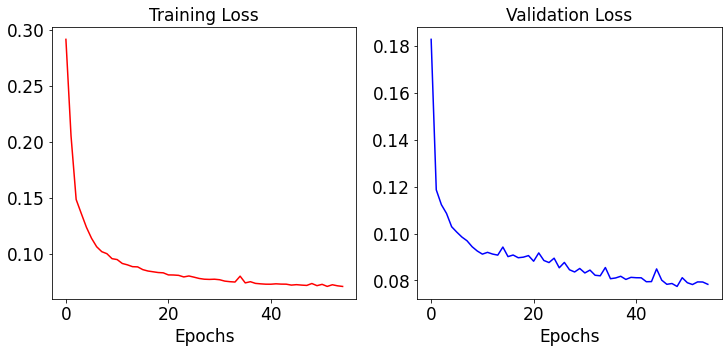

In [14]:
DEBUG=0
#================================================================================
#setting font
if(DEBUG==1):
	font={'family' : 'normal',
		'weight' : 'bold',
		'size' : 22}
	matplotlib.rc('font',**font)
small_size=12
medium_size=17
Bigger_size=22

plt.rc('font',size=medium_size)  #controls default text size
plt.rc('axes',titlesize=medium_size)  #controls font size of axis title
plt.rc('axes',labelsize=medium_size)
plt.rc('xtick',labelsize=medium_size)
plt.rc('ytick',labelsize=medium_size)
plt.rc('legend',fontsize=medium_size)
plt.rc('figure',titlesize=medium_size)
#================================================================================

fig,ax=plt.subplots(1,2,figsize=(12,5))
ax[0].plot(results["trainLoss"],'r',label='Train loss')
ax[0].set_title('Training Loss')

ax[1].plot(results["valLoss"],'b',label='Validation loss')
ax[1].set_title("Validation Loss")
for ax in ax.flat:
    ax.set(xlabel='Epochs')

In [15]:
trainLosss=results["trainLoss"]
tls=np.array(trainLosss)
tlss=np.column_stack([tls])
fntls='Optimized_tls.txt'
#np.savetxt(fntls,tlss)


In [16]:
valLosss=results["valLoss"]
vls=np.array(valLosss)
vlss=np.column_stack([vls])
fnvls='Optimized_vls.txt'
#np.savetxt(fnvls,vlss)

In [17]:
# print(valLoss)
# print(min(valLoss))
# print(valLoss.index(min(valLoss)))

# Plot results

In [18]:
def create_reverse_normalizer(standardizer):
  mean = standardizer.mean["Day-ahead Price [EUR/MWh]"]
  std = standardizer.std["Day-ahead Price [EUR/MWh]"]

  def reverse(series):
    return series * std + mean
  
  return reverse

reverse_normalization = create_reverse_normalizer(prices_standardizer)

In [19]:
import matplotlib.pyplot as plt
from  matplotlib import colors
from matplotlib.lines import Line2D


qntls=np.array(quantiles)
normalize = colors.Normalize(vmin=qntls.min(), vmax=qntls.max())
cmap = plt.cm.get_cmap('gray')

custom_lines = [
                Line2D([0], [0], color=cmap(0.6), lw=4),
                Line2D([0], [0], color=cmap(0.5), lw=4),
                Line2D([0], [0], color=cmap(0.4), lw=4),
                Line2D([0], [0], color=cmap(0.3), lw=4),
                Line2D([0], [0], color='red', lw=1.7),]

assert len(custom_lines) == len(quantiles) // 2 + 1, "Wrong number of custom lines for number of quantiles"



def predict_and_plot(model, start: datetime, num_days, dataset):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # device = torch.device("cpu")

    model = model.to(device)

    dates = pd.date_range(start, start + datetime.timedelta(days=num_days - 1), freq="D")

    predictions = []
    actuals = []

    for day in dates:
        input_tensor = dataset.examples[day][0]
        actual = dataset.examples[day][1]
        prediction = model(input_tensor.unsqueeze(dim=0).float().to(device)).cpu().detach()

        predictions.append(prediction)
        actuals.append(actual)
            
    pred_quantiles = torch.cat(predictions, dim=0)
    actuals = torch.cat(actuals)

    labels = pd.date_range(start, start + datetime.timedelta(days=num_days, hours=-1), freq="H")
    
    plt.figure(figsize=(20, 10), dpi=600)
    plt.title(f"{dataset.name}, start: {start}, end: {dates[-1]}")
    
    legend_labels = []

    for i in range(len(quantiles) // 2):
      label=f"quantile {quantiles[i] * 100} - {quantiles[len(quantiles) - 1 - i] * 100}"

      legend_labels.append(label)

      plt.fill_between(labels, 
                        reverse_normalization(pred_quantiles[:, i]), 
                        reverse_normalization(pred_quantiles[:, len(quantiles) - 1 - i]), 
                        label=label, 
                        color=cmap(normalize(quantiles[i])), 
                        alpha=0.2)

    plt.plot(labels, reverse_normalization(actuals), label="actual", color="red")

    legend_labels.append("actual value")

    plt.legend(custom_lines, legend_labels)
    plt.savefig("test.png", dpi=600)
    plt.show()


is cuda used as device : False


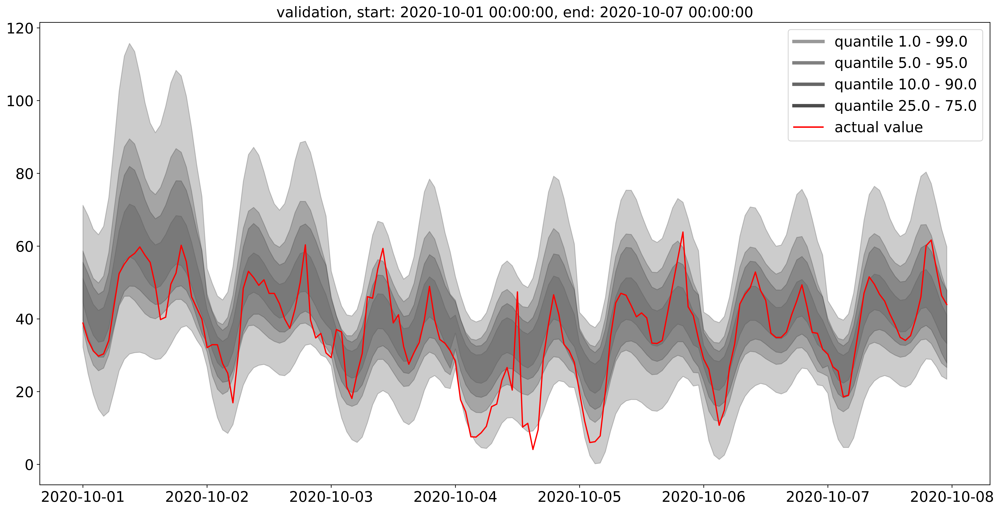

In [20]:
# test_dataset.examples.keys()

print(f'\nis cuda used as device : {next(model.parameters()).is_cuda}')

# predict_and_plot(model, datetime.datetime(2020, 9, 25), 7, validation_dataset)
predict_and_plot(model, datetime.datetime(2020, 10, 1), 7, validation_dataset)

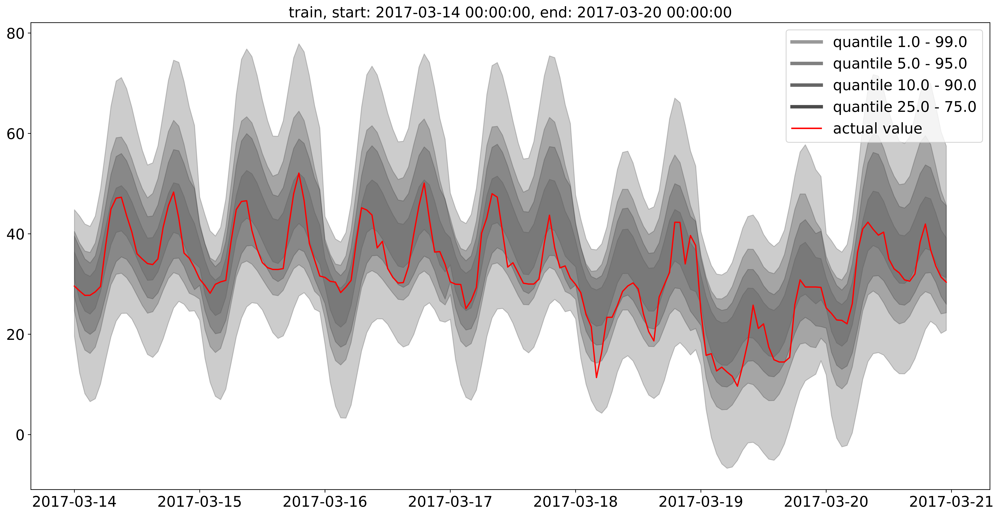

In [21]:
predict_and_plot(model, datetime.datetime(2017, 3, 14), 7, train_dataset)

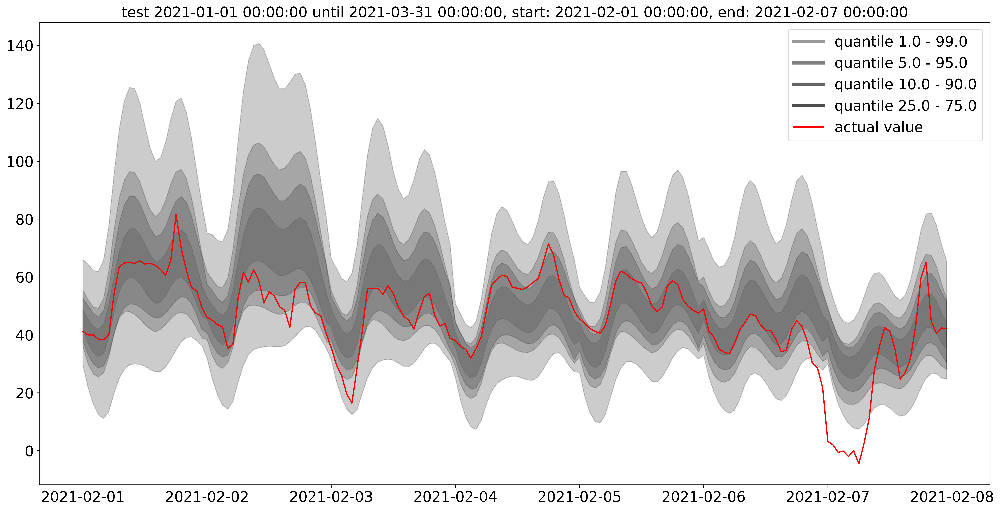

In [22]:
predict_and_plot(model, datetime.datetime(2021, 2, 1), 7, test_dataset)

# Hyperparameter optimization

In [23]:
# !pip install optuna
import optuna

In [24]:
"""
We optimize the neural network architecture as well as the optimizer
configuration.
"""

import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from torchvision import datasets
from torchvision import transforms

import optuna
from optuna.trial import TrialState


def objective(trial):

  # It doesn't make sense to optimize tolerance as higher is better for validation loss
  tolerance=6
  max_epochs = 100
  
  quantiles = [0.01, 0.05, 0.1, 0.25, 0.75, 0.9, 0.95, 0.99]

  num_layers = 4

  params = {
      "hidden_size": trial.suggest_int("hidden_size", 5, 120, 5),
      "num_layers": trial.suggest_int("num_layers", 2, 5),
      "lr": trial.suggest_float("lr", 1e-3, 1e-1, log=True),
      "noise2Weight": trial.suggest_float("noise2Weight",0.0,1.0),
      
  }

  print(params)

  results = training_loop(train_dataloader, validation_dataloader, quantiles, 
                          hidden_size=params["hidden_size"], 
                          num_layers=params["num_layers"],
                          lr=params["lr"],
                          tolerance=tolerance, 
                          noise2Weight=params["noise2Weight"], 
                          max_epochs=max_epochs)

  
  return results["best_score"]


def optimize(train_loader, valid_loader):

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, timeout=600)

    pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
    complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

    print("Study statistics: ")
    print("  Number of finished trials: ", len(study.trials))
    print("  Number of pruned trials: ", len(pruned_trials))
    print("  Number of complete trials: ", len(complete_trials))

    print("Best trial:")
    trial = study.best_trial

    print("  Value: ", trial.value)

    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
    
    return study

In [ ]:
study = optimize(train_dataloader, validation_dataloader)

[I 2021-04-16 20:34:00,051] A new study created in memory with name: no-name-83e5a29f-e63d-4d64-b534-9b232e3117b1


{'hidden_size': 35, 'num_layers': 2, 'lr': 0.03269548039484351, 'noise2Weight': 0.48414211706594723}
epoch: 0
Epoch(1/100) | Training loss: 0.11643305995634624 | Epoch(1/100) | Validation loss: 0.09401148185133934 | 
Validation loss decreased (inf --> 0.094011).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08212588110140391 | Epoch(2/100) | Validation loss: 0.08130358718335629 | 
Validation loss decreased (0.094011 --> 0.081304).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07659418050731931 | Epoch(3/100) | Validation loss: 0.08532388135790825 | 
EarlyStopping counter: 1 out of 6
epoch: 3
Epoch(4/100) | Training loss: 0.07406030403716224 | Epoch(4/100) | Validation loss: 0.0786539800465107 | 
Validation loss decreased (0.081304 --> 0.078654).
Saving the model

epoch: 4
Epoch(5/100) | Training loss: 0.07243845675672804 | Epoch(5/100) | Validation loss: 0.07728136330842972 | 
Validation loss decreased (0.078654 --> 0.077281).
Saving the model

epoch: 5
Epoch(

[I 2021-04-16 20:34:13,816] Trial 0 finished with value: -0.0761514026671648 and parameters: {'hidden_size': 35, 'num_layers': 2, 'lr': 0.03269548039484351, 'noise2Weight': 0.48414211706594723}. Best is trial 0 with value: -0.0761514026671648.


Epoch(20/100) | Training loss: 0.06310524844697543 | Epoch(20/100) | Validation loss: 0.07997828163206577 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 85, 'num_layers': 2, 'lr': 0.0021304721139317633, 'noise2Weight': 0.9267211896595847}
epoch: 0
Epoch(1/100) | Training loss: 0.14054119544369834 | Epoch(1/100) | Validation loss: 0.09307970851659775 | 
Validation loss decreased (inf --> 0.093080).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08459206521511078 | Epoch(2/100) | Validation loss: 0.08562731742858887 | 
Validation loss decreased (0.093080 --> 0.085627).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08011887020298412 | Epoch(3/100) | Validation loss: 0.08545059338212013 | 
Validation loss decreased (0.085627 --> 0.085451).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07882289226566042 | Epoch(4/100) | Validation loss: 0.08415750600397587 | 
V

[I 2021-04-16 20:34:34,847] Trial 1 finished with value: -0.07283113710582256 and parameters: {'hidden_size': 85, 'num_layers': 2, 'lr': 0.0021304721139317633, 'noise2Weight': 0.9267211896595847}. Best is trial 1 with value: -0.07283113710582256.


Epoch(30/100) | Training loss: 0.06282061359712056 | Epoch(30/100) | Validation loss: 0.07633665390312672 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 20, 'num_layers': 4, 'lr': 0.002617984388328267, 'noise2Weight': 0.2361454558223548}
epoch: 0
Epoch(1/100) | Training loss: 0.18712389852319444 | Epoch(1/100) | Validation loss: 0.11408159136772156 | 
Validation loss decreased (inf --> 0.114082).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.11989343613386154 | Epoch(2/100) | Validation loss: 0.09821724891662598 | 
Validation loss decreased (0.114082 --> 0.098217).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.09579504898616246 | Epoch(3/100) | Validation loss: 0.09637445956468582 | 
Validation loss decreased (0.098217 --> 0.096374).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08957320877483912 | Epoch(4/100) | Validation loss: 0.09301654249429703 | 
Va

[I 2021-04-16 20:34:51,642] Trial 2 finished with value: -0.07653611153364182 and parameters: {'hidden_size': 20, 'num_layers': 4, 'lr': 0.002617984388328267, 'noise2Weight': 0.2361454558223548}. Best is trial 1 with value: -0.07283113710582256.


Epoch(20/100) | Training loss: 0.07057988026312419 | Epoch(20/100) | Validation loss: 0.07836750149726868 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 80, 'num_layers': 4, 'lr': 0.0074375080355847285, 'noise2Weight': 0.7108121111697002}
epoch: 0
Epoch(1/100) | Training loss: 0.1216279291680881 | Epoch(1/100) | Validation loss: 0.0946316346526146 | 
Validation loss decreased (inf --> 0.094632).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08640727613653455 | Epoch(2/100) | Validation loss: 0.10526786744594574 | 
EarlyStopping counter: 1 out of 6
epoch: 2
Epoch(3/100) | Training loss: 0.08610308447054454 | Epoch(3/100) | Validation loss: 0.08788185566663742 | 
Validation loss decreased (0.094632 --> 0.087882).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07761079956378256 | Epoch(4/100) | Validation loss: 0.0859660916030407 | 
Validation loss decreased (0.087882 -->

[I 2021-04-16 20:35:21,623] Trial 3 finished with value: -0.07310686074197292 and parameters: {'hidden_size': 80, 'num_layers': 4, 'lr': 0.0074375080355847285, 'noise2Weight': 0.7108121111697002}. Best is trial 1 with value: -0.07283113710582256.


Epoch(35/100) | Training loss: 0.05820173174142838 | Epoch(35/100) | Validation loss: 0.07930806092917919 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 15, 'num_layers': 3, 'lr': 0.0966751894146201, 'noise2Weight': 0.3933350502419135}
epoch: 0
Epoch(1/100) | Training loss: 0.14105404828275953 | Epoch(1/100) | Validation loss: 0.1086811050772667 | 
Validation loss decreased (inf --> 0.108681).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09690615002598081 | Epoch(2/100) | Validation loss: 0.09243418276309967 | 
Validation loss decreased (0.108681 --> 0.092434).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08686655185052326 | Epoch(3/100) | Validation loss: 0.08586958050727844 | 
Validation loss decreased (0.092434 --> 0.085870).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08628607200724737 | Epoch(4/100) | Validation loss: 0.08454528078436852 | 
Valid

[I 2021-04-16 20:35:33,907] Trial 4 finished with value: -0.07755382359027863 and parameters: {'hidden_size': 15, 'num_layers': 3, 'lr': 0.0966751894146201, 'noise2Weight': 0.3933350502419135}. Best is trial 1 with value: -0.07283113710582256.


Epoch(16/100) | Training loss: 0.07297729945608548 | Epoch(16/100) | Validation loss: 0.07874525710940361 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 70, 'num_layers': 5, 'lr': 0.0015249313583865286, 'noise2Weight': 0.9199683568320364}
epoch: 0
Epoch(1/100) | Training loss: 0.15891320130654743 | Epoch(1/100) | Validation loss: 0.10100704059004784 | 
Validation loss decreased (inf --> 0.101007).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09641860404184886 | Epoch(2/100) | Validation loss: 0.09329438582062721 | 
Validation loss decreased (0.101007 --> 0.093294).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08805272302457265 | Epoch(3/100) | Validation loss: 0.08631733432412148 | 
Validation loss decreased (0.093294 --> 0.086317).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08542272256953376 | Epoch(4/100) | Validation loss: 0.08961501345038414 | 
E

[I 2021-04-16 20:36:03,074] Trial 5 finished with value: -0.0744793526828289 and parameters: {'hidden_size': 70, 'num_layers': 5, 'lr': 0.0015249313583865286, 'noise2Weight': 0.9199683568320364}. Best is trial 1 with value: -0.07283113710582256.


Epoch(31/100) | Training loss: 0.06675942593387195 | Epoch(31/100) | Validation loss: 0.0790930725634098 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 85, 'num_layers': 4, 'lr': 0.0785845821257844, 'noise2Weight': 0.9232567827941148}
epoch: 0
Epoch(1/100) | Training loss: 0.27346208627734864 | Epoch(1/100) | Validation loss: 0.11488395929336548 | 
Validation loss decreased (inf --> 0.114884).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.13885935097932817 | Epoch(2/100) | Validation loss: 0.12265995889902115 | 
EarlyStopping counter: 1 out of 6
epoch: 2
Epoch(3/100) | Training loss: 0.11816665274756295 | Epoch(3/100) | Validation loss: 0.11307728663086891 | 
Validation loss decreased (0.114884 --> 0.113077).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.11598859003611973 | Epoch(4/100) | Validation loss: 0.12745806202292442 | 
EarlyStopping counter: 1 out of 6
epoch:

[I 2021-04-16 20:36:25,982] Trial 6 finished with value: -0.08033253997564316 and parameters: {'hidden_size': 85, 'num_layers': 4, 'lr': 0.0785845821257844, 'noise2Weight': 0.9232567827941148}. Best is trial 1 with value: -0.07283113710582256.


Epoch(27/100) | Training loss: 0.08274581219468798 | Epoch(27/100) | Validation loss: 0.08540020510554314 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 75, 'num_layers': 5, 'lr': 0.0014318671964406546, 'noise2Weight': 0.7037645679509952}
epoch: 0
Epoch(1/100) | Training loss: 0.1692554216299738 | Epoch(1/100) | Validation loss: 0.11226599663496017 | 
Validation loss decreased (inf --> 0.112266).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.11169814318418503 | Epoch(2/100) | Validation loss: 0.10442870855331421 | 
Validation loss decreased (0.112266 --> 0.104429).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.09021274426153728 | Epoch(3/100) | Validation loss: 0.08694523572921753 | 
Validation loss decreased (0.104429 --> 0.086945).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08542561935526984 | Epoch(4/100) | Validation loss: 0.09210893139243126 | 
Ea

[I 2021-04-16 20:36:41,993] Trial 7 finished with value: -0.07631750963628292 and parameters: {'hidden_size': 75, 'num_layers': 5, 'lr': 0.0014318671964406546, 'noise2Weight': 0.7037645679509952}. Best is trial 1 with value: -0.07283113710582256.


Epoch(17/100) | Training loss: 0.07199627916727747 | Epoch(17/100) | Validation loss: 0.07748378999531269 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 45, 'num_layers': 3, 'lr': 0.06666003529518806, 'noise2Weight': 0.5183207765724424}
epoch: 0
Epoch(1/100) | Training loss: 0.14358970842191152 | Epoch(1/100) | Validation loss: 0.1247958093881607 | 
Validation loss decreased (inf --> 0.124796).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.10560617744922637 | Epoch(2/100) | Validation loss: 0.09752759709954262 | 
Validation loss decreased (0.124796 --> 0.097528).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.0899585479072162 | Epoch(3/100) | Validation loss: 0.09035622701048851 | 
Validation loss decreased (0.097528 --> 0.090356).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.09172049569232123 | Epoch(4/100) | Validation loss: 0.09288844093680382 | 
Early

[I 2021-04-16 20:36:59,754] Trial 8 finished with value: -0.07852714695036411 and parameters: {'hidden_size': 45, 'num_layers': 3, 'lr': 0.06666003529518806, 'noise2Weight': 0.5183207765724424}. Best is trial 1 with value: -0.07283113710582256.


Epoch(23/100) | Training loss: 0.07529527491756847 | Epoch(23/100) | Validation loss: 0.08027645573019981 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 75, 'num_layers': 4, 'lr': 0.03524756855581903, 'noise2Weight': 0.062415467222108556}
epoch: 0
Epoch(1/100) | Training loss: 0.15891697853803635 | Epoch(1/100) | Validation loss: 0.10782686993479729 | 
Validation loss decreased (inf --> 0.107827).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.10530041605234146 | Epoch(2/100) | Validation loss: 0.10027345269918442 | 
Validation loss decreased (0.107827 --> 0.100273).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.09259713015386037 | Epoch(3/100) | Validation loss: 0.08794399350881577 | 
Validation loss decreased (0.100273 --> 0.087944).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08820644074252673 | Epoch(4/100) | Validation loss: 0.08973953872919083 | 
E

[I 2021-04-16 20:37:15,150] Trial 9 finished with value: -0.07797659374773502 and parameters: {'hidden_size': 75, 'num_layers': 4, 'lr': 0.03524756855581903, 'noise2Weight': 0.062415467222108556}. Best is trial 1 with value: -0.07283113710582256.


Epoch(18/100) | Training loss: 0.07483940497040749 | Epoch(18/100) | Validation loss: 0.07913661748170853 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 120, 'num_layers': 2, 'lr': 0.004994241994524056, 'noise2Weight': 0.9900628980076182}
epoch: 0
Epoch(1/100) | Training loss: 0.11370516845158168 | Epoch(1/100) | Validation loss: 0.0911298543214798 | 
Validation loss decreased (inf --> 0.091130).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08537786517824446 | Epoch(2/100) | Validation loss: 0.09821304678916931 | 
EarlyStopping counter: 1 out of 6
epoch: 2
Epoch(3/100) | Training loss: 0.0797937410218375 | Epoch(3/100) | Validation loss: 0.08298591524362564 | 
Validation loss decreased (0.091130 --> 0.082986).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.0757470038320337 | Epoch(4/100) | Validation loss: 0.07894996181130409 | 
Validation loss decreased (0.082986 -->

[I 2021-04-16 20:37:29,057] Trial 10 finished with value: -0.07345923781394958 and parameters: {'hidden_size': 120, 'num_layers': 2, 'lr': 0.004994241994524056, 'noise2Weight': 0.9900628980076182}. Best is trial 1 with value: -0.07283113710582256.


Epoch(19/100) | Training loss: 0.06620189622044563 | Epoch(19/100) | Validation loss: 0.07486769743263721 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 110, 'num_layers': 3, 'lr': 0.009708690020309808, 'noise2Weight': 0.7436915488103149}
epoch: 0
Epoch(1/100) | Training loss: 0.12887646960360663 | Epoch(1/100) | Validation loss: 0.09429467841982841 | 
Validation loss decreased (inf --> 0.094295).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08463882293019975 | Epoch(2/100) | Validation loss: 0.08864058181643486 | 
Validation loss decreased (0.094295 --> 0.088641).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07977067221488271 | Epoch(3/100) | Validation loss: 0.08688560500741005 | 
Validation loss decreased (0.088641 --> 0.086886).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07513571136764118 | Epoch(4/100) | Validation loss: 0.08893094956874847 | 
E

[I 2021-04-16 20:37:47,765] Trial 11 finished with value: -0.07362256571650505 and parameters: {'hidden_size': 110, 'num_layers': 3, 'lr': 0.009708690020309808, 'noise2Weight': 0.7436915488103149}. Best is trial 1 with value: -0.07283113710582256.


Epoch(23/100) | Training loss: 0.062052001378365924 | Epoch(23/100) | Validation loss: 0.08149019256234169 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 100, 'num_layers': 2, 'lr': 0.0072180281849970225, 'noise2Weight': 0.7445049116469648}
epoch: 0
Epoch(1/100) | Training loss: 0.11224370204976626 | Epoch(1/100) | Validation loss: 0.09293733164668083 | 
Validation loss decreased (inf --> 0.092937).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08150154863085066 | Epoch(2/100) | Validation loss: 0.08966824784874916 | 
Validation loss decreased (0.092937 --> 0.089668).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07870756291917393 | Epoch(3/100) | Validation loss: 0.07823970355093479 | 
Validation loss decreased (0.089668 --> 0.078240).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07804415949753353 | Epoch(4/100) | Validation loss: 0.07832946814596653 | 

[I 2021-04-16 20:38:01,338] Trial 12 finished with value: -0.07388602569699287 and parameters: {'hidden_size': 100, 'num_layers': 2, 'lr': 0.0072180281849970225, 'noise2Weight': 0.7445049116469648}. Best is trial 1 with value: -0.07283113710582256.


Epoch(19/100) | Training loss: 0.06570808046630451 | Epoch(19/100) | Validation loss: 0.07803216017782688 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 95, 'num_layers': 4, 'lr': 0.0040138520182127066, 'noise2Weight': 0.8119659495325111}
epoch: 0
Epoch(1/100) | Training loss: 0.1270874804684094 | Epoch(1/100) | Validation loss: 0.10134909674525261 | 
Validation loss decreased (inf --> 0.101349).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.0888029328414372 | Epoch(2/100) | Validation loss: 0.08755170181393623 | 
Validation loss decreased (0.101349 --> 0.087552).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08305231183767318 | Epoch(3/100) | Validation loss: 0.08474462851881981 | 
Validation loss decreased (0.087552 --> 0.084745).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08091291955539158 | Epoch(4/100) | Validation loss: 0.09145838767290115 | 
Ear

[I 2021-04-16 20:38:25,083] Trial 13 finished with value: -0.07278479263186455 and parameters: {'hidden_size': 95, 'num_layers': 4, 'lr': 0.0040138520182127066, 'noise2Weight': 0.8119659495325111}. Best is trial 13 with value: -0.07278479263186455.


Epoch(27/100) | Training loss: 0.06322274314505713 | Epoch(27/100) | Validation loss: 0.07688027247786522 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 95, 'num_layers': 5, 'lr': 0.003154036023957866, 'noise2Weight': 0.8591368446432983}
epoch: 0
Epoch(1/100) | Training loss: 0.14172691596405848 | Epoch(1/100) | Validation loss: 0.11298076063394547 | 
Validation loss decreased (inf --> 0.112981).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09167862853833607 | Epoch(2/100) | Validation loss: 0.09893848747015 | 
Validation loss decreased (0.112981 --> 0.098938).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08831914961338043 | Epoch(3/100) | Validation loss: 0.09763427823781967 | 
Validation loss decreased (0.098938 --> 0.097634).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.088248972594738 | Epoch(4/100) | Validation loss: 0.09134893864393234 | 
Validat

[I 2021-04-16 20:38:47,068] Trial 14 finished with value: -0.07766619510948658 and parameters: {'hidden_size': 95, 'num_layers': 5, 'lr': 0.003154036023957866, 'noise2Weight': 0.8591368446432983}. Best is trial 13 with value: -0.07278479263186455.


Epoch(23/100) | Training loss: 0.06878099973712648 | Epoch(23/100) | Validation loss: 0.08160131424665451 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 60, 'num_layers': 3, 'lr': 0.0010316501324764429, 'noise2Weight': 0.9938657807445974}
epoch: 0
Epoch(1/100) | Training loss: 0.18573419877461025 | Epoch(1/100) | Validation loss: 0.10847429558634758 | 
Validation loss decreased (inf --> 0.108474).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.10189805882317679 | Epoch(2/100) | Validation loss: 0.0953730158507824 | 
Validation loss decreased (0.108474 --> 0.095373).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08725587278604507 | Epoch(3/100) | Validation loss: 0.08967804163694382 | 
Validation loss decreased (0.095373 --> 0.089678).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08275941471968379 | Epoch(4/100) | Validation loss: 0.09110167250037193 | 
Ea

[I 2021-04-16 20:39:10,105] Trial 15 finished with value: -0.07481495290994644 and parameters: {'hidden_size': 60, 'num_layers': 3, 'lr': 0.0010316501324764429, 'noise2Weight': 0.9938657807445974}. Best is trial 13 with value: -0.07278479263186455.


Epoch(30/100) | Training loss: 0.06549314920391355 | Epoch(30/100) | Validation loss: 0.07585870288312435 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 120, 'num_layers': 4, 'lr': 0.018179308275316265, 'noise2Weight': 0.6163101785082761}
epoch: 0
Epoch(1/100) | Training loss: 0.13630143191133226 | Epoch(1/100) | Validation loss: 0.10378975048661232 | 
Validation loss decreased (inf --> 0.103790).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09610501293625151 | Epoch(2/100) | Validation loss: 0.09276147186756134 | 
Validation loss decreased (0.103790 --> 0.092761).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08428111949137279 | Epoch(3/100) | Validation loss: 0.0851670689880848 | 
Validation loss decreased (0.092761 --> 0.085167).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08487721458077431 | Epoch(4/100) | Validation loss: 0.10297572985291481 | 
Ea

[I 2021-04-16 20:39:25,566] Trial 16 finished with value: -0.07658141851425171 and parameters: {'hidden_size': 120, 'num_layers': 4, 'lr': 0.018179308275316265, 'noise2Weight': 0.6163101785082761}. Best is trial 13 with value: -0.07278479263186455.


Epoch(17/100) | Training loss: 0.07166564560362271 | Epoch(17/100) | Validation loss: 0.07698393985629082 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 95, 'num_layers': 2, 'lr': 0.0025050353706078973, 'noise2Weight': 0.8322480162492893}
epoch: 0
Epoch(1/100) | Training loss: 0.13372261502913066 | Epoch(1/100) | Validation loss: 0.09642452001571655 | 
Validation loss decreased (inf --> 0.096425).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08685254667486464 | Epoch(2/100) | Validation loss: 0.09082609787583351 | 
Validation loss decreased (0.096425 --> 0.090826).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07998310029506683 | Epoch(3/100) | Validation loss: 0.08346053771674633 | 
Validation loss decreased (0.090826 --> 0.083461).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.076673723757267 | Epoch(4/100) | Validation loss: 0.08042245358228683 | 
Val

[I 2021-04-16 20:39:38,250] Trial 17 finished with value: -0.07437730580568314 and parameters: {'hidden_size': 95, 'num_layers': 2, 'lr': 0.0025050353706078973, 'noise2Weight': 0.8322480162492893}. Best is trial 13 with value: -0.07278479263186455.


Epoch(18/100) | Training loss: 0.06694901500429426 | Epoch(18/100) | Validation loss: 0.07513144239783287 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 55, 'num_layers': 3, 'lr': 0.0037686967440616536, 'noise2Weight': 0.9980014824805234}
epoch: 0
Epoch(1/100) | Training loss: 0.13839799697910035 | Epoch(1/100) | Validation loss: 0.09081178531050682 | 
Validation loss decreased (inf --> 0.090812).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08971706479787826 | Epoch(2/100) | Validation loss: 0.0902235172688961 | 
Validation loss decreased (0.090812 --> 0.090224).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08115708519305502 | Epoch(3/100) | Validation loss: 0.08872110396623611 | 
Validation loss decreased (0.090224 --> 0.088721).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07763664413775717 | Epoch(4/100) | Validation loss: 0.0794264655560255 | 
Val

[I 2021-04-16 20:39:54,592] Trial 18 finished with value: -0.07264445535838604 and parameters: {'hidden_size': 55, 'num_layers': 3, 'lr': 0.0037686967440616536, 'noise2Weight': 0.9980014824805234}. Best is trial 18 with value: -0.07264445535838604.


Epoch(21/100) | Training loss: 0.06622976320130484 | Epoch(21/100) | Validation loss: 0.07734831795096397 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 55, 'num_layers': 3, 'lr': 0.0043436143391481895, 'noise2Weight': 0.8278843648189498}
epoch: 0
Epoch(1/100) | Training loss: 0.13032087662390301 | Epoch(1/100) | Validation loss: 0.09352799132466316 | 
Validation loss decreased (inf --> 0.093528).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08594431046928679 | Epoch(2/100) | Validation loss: 0.0949261225759983 | 
EarlyStopping counter: 1 out of 6
epoch: 2
Epoch(3/100) | Training loss: 0.0811430570270334 | Epoch(3/100) | Validation loss: 0.08532976731657982 | 
Validation loss decreased (0.093528 --> 0.085330).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07916667961648532 | Epoch(4/100) | Validation loss: 0.0861540287733078 | 
EarlyStopping counter: 1 out of 6
epoch

[I 2021-04-16 20:40:08,553] Trial 19 finished with value: -0.07630412466824055 and parameters: {'hidden_size': 55, 'num_layers': 3, 'lr': 0.0043436143391481895, 'noise2Weight': 0.8278843648189498}. Best is trial 18 with value: -0.07264445535838604.


Epoch(18/100) | Training loss: 0.06751032620668411 | Epoch(18/100) | Validation loss: 0.07757538184523582 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 35, 'num_layers': 4, 'lr': 0.015250665207664578, 'noise2Weight': 0.5994720357070121}
epoch: 0
Epoch(1/100) | Training loss: 0.13694104765142714 | Epoch(1/100) | Validation loss: 0.09654797241091728 | 
Validation loss decreased (inf --> 0.096548).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09445369499070304 | Epoch(2/100) | Validation loss: 0.08942101150751114 | 
Validation loss decreased (0.096548 --> 0.089421).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.0847476037485259 | Epoch(3/100) | Validation loss: 0.08671996369957924 | 
Validation loss decreased (0.089421 --> 0.086720).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07904860324093274 | Epoch(4/100) | Validation loss: 0.08915591984987259 | 
Ear

[I 2021-04-16 20:40:24,896] Trial 20 finished with value: -0.07546009495854378 and parameters: {'hidden_size': 35, 'num_layers': 4, 'lr': 0.015250665207664578, 'noise2Weight': 0.5994720357070121}. Best is trial 18 with value: -0.07264445535838604.


Epoch(19/100) | Training loss: 0.06747165939637594 | Epoch(19/100) | Validation loss: 0.07950169406831264 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 90, 'num_layers': 3, 'lr': 0.0017527398761829932, 'noise2Weight': 0.9951016009556686}
epoch: 0
Epoch(1/100) | Training loss: 0.14899268235479082 | Epoch(1/100) | Validation loss: 0.09436564147472382 | 
Validation loss decreased (inf --> 0.094366).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08847113805157798 | Epoch(2/100) | Validation loss: 0.08709163218736649 | 
Validation loss decreased (0.094366 --> 0.087092).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08365642832858222 | Epoch(3/100) | Validation loss: 0.09084236994385719 | 
EarlyStopping counter: 1 out of 6
epoch: 3
Epoch(4/100) | Training loss: 0.07958823995930808 | Epoch(4/100) | Validation loss: 0.0805999431759119 | 
Validation loss decreased (0.087092 -

[I 2021-04-16 20:40:35,295] Trial 21 finished with value: -0.07427100837230682 and parameters: {'hidden_size': 90, 'num_layers': 3, 'lr': 0.0017527398761829932, 'noise2Weight': 0.9951016009556686}. Best is trial 18 with value: -0.07264445535838604.


Epoch(13/100) | Training loss: 0.06914596685341426 | Epoch(13/100) | Validation loss: 0.07511709816753864 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 110, 'num_layers': 2, 'lr': 0.004352924942684839, 'noise2Weight': 0.9170986425155383}
epoch: 0
Epoch(1/100) | Training loss: 0.11804866141506604 | Epoch(1/100) | Validation loss: 0.0938011035323143 | 
Validation loss decreased (inf --> 0.093801).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08222464386905942 | Epoch(2/100) | Validation loss: 0.08517005294561386 | 
Validation loss decreased (0.093801 --> 0.085170).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07875888443418912 | Epoch(3/100) | Validation loss: 0.08651426434516907 | 
EarlyStopping counter: 1 out of 6
epoch: 3
Epoch(4/100) | Training loss: 0.0775874488055706 | Epoch(4/100) | Validation loss: 0.08527237549424171 | 
EarlyStopping counter: 2 out of 6
epoc

[I 2021-04-16 20:40:50,027] Trial 22 finished with value: -0.0743874330073595 and parameters: {'hidden_size': 110, 'num_layers': 2, 'lr': 0.004352924942684839, 'noise2Weight': 0.9170986425155383}. Best is trial 18 with value: -0.07264445535838604.


Epoch(20/100) | Training loss: 0.06495889542358262 | Epoch(20/100) | Validation loss: 0.07609484530985355 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 50, 'num_layers': 3, 'lr': 0.0010883474649234608, 'noise2Weight': 0.9944450490362798}
epoch: 0
Epoch(1/100) | Training loss: 0.1910655385681561 | Epoch(1/100) | Validation loss: 0.11393778026103973 | 
Validation loss decreased (inf --> 0.113938).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.10719055767570224 | Epoch(2/100) | Validation loss: 0.09472488984465599 | 
Validation loss decreased (0.113938 --> 0.094725).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08920496829918452 | Epoch(3/100) | Validation loss: 0.09300081431865692 | 
Validation loss decreased (0.094725 --> 0.093001).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.084369224522795 | Epoch(4/100) | Validation loss: 0.08826964721083641 | 
Vali

[I 2021-04-16 20:41:15,769] Trial 23 finished with value: -0.07351644709706306 and parameters: {'hidden_size': 50, 'num_layers': 3, 'lr': 0.0010883474649234608, 'noise2Weight': 0.9944450490362798}. Best is trial 18 with value: -0.07264445535838604.


Epoch(33/100) | Training loss: 0.06529027617403439 | Epoch(33/100) | Validation loss: 0.07452670857310295 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 105, 'num_layers': 2, 'lr': 0.002371118872220372, 'noise2Weight': 0.81462641229344}
epoch: 0
Epoch(1/100) | Training loss: 0.13430496752262117 | Epoch(1/100) | Validation loss: 0.09125382080674171 | 
Validation loss decreased (inf --> 0.091254).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08517144982303892 | Epoch(2/100) | Validation loss: 0.09092909842729568 | 
Validation loss decreased (0.091254 --> 0.090929).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.07995301187038421 | Epoch(3/100) | Validation loss: 0.08342775702476501 | 
Validation loss decreased (0.090929 --> 0.083428).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07675023749470711 | Epoch(4/100) | Validation loss: 0.0829943809658289 | 
Vali

[I 2021-04-16 20:41:31,318] Trial 24 finished with value: -0.0733532216399908 and parameters: {'hidden_size': 105, 'num_layers': 2, 'lr': 0.002371118872220372, 'noise2Weight': 0.81462641229344}. Best is trial 18 with value: -0.07264445535838604.


Epoch(21/100) | Training loss: 0.06607420668005944 | Epoch(21/100) | Validation loss: 0.07802644744515419 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 65, 'num_layers': 4, 'lr': 0.0057225595956966165, 'noise2Weight': 0.9286769211134551}
epoch: 0
Epoch(1/100) | Training loss: 0.13493830135890417 | Epoch(1/100) | Validation loss: 0.10201172903180122 | 
Validation loss decreased (inf --> 0.102012).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09609827825001307 | Epoch(2/100) | Validation loss: 0.0908057726919651 | 
Validation loss decreased (0.102012 --> 0.090806).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08780425829546792 | Epoch(3/100) | Validation loss: 0.09067001938819885 | 
Validation loss decreased (0.090806 --> 0.090670).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.08297356909939221 | Epoch(4/100) | Validation loss: 0.08951998502016068 | 
Va

[I 2021-04-16 20:41:42,643] Trial 25 finished with value: -0.07763783074915409 and parameters: {'hidden_size': 65, 'num_layers': 4, 'lr': 0.0057225595956966165, 'noise2Weight': 0.9286769211134551}. Best is trial 18 with value: -0.07264445535838604.


Epoch(13/100) | Training loss: 0.07307504415512085 | Epoch(13/100) | Validation loss: 0.08025051653385162 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 85, 'num_layers': 3, 'lr': 0.003292281002631879, 'noise2Weight': 0.6472086220881028}
epoch: 0
Epoch(1/100) | Training loss: 0.12445901674883707 | Epoch(1/100) | Validation loss: 0.09650307893753052 | 
Validation loss decreased (inf --> 0.096503).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.08570137300661632 | Epoch(2/100) | Validation loss: 0.1023651510477066 | 
EarlyStopping counter: 1 out of 6
epoch: 2
Epoch(3/100) | Training loss: 0.08332609310746193 | Epoch(3/100) | Validation loss: 0.08831367641687393 | 
Validation loss decreased (0.096503 --> 0.088314).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.07811730674334935 | Epoch(4/100) | Validation loss: 0.08077494613826275 | 
Validation loss decreased (0.088314 --

[I 2021-04-16 20:41:53,888] Trial 26 finished with value: -0.07502649165689945 and parameters: {'hidden_size': 85, 'num_layers': 3, 'lr': 0.003292281002631879, 'noise2Weight': 0.6472086220881028}. Best is trial 18 with value: -0.07264445535838604.


Epoch(14/100) | Training loss: 0.06769669162375587 | Epoch(14/100) | Validation loss: 0.07756887003779411 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 65, 'num_layers': 5, 'lr': 0.0018598446905453083, 'noise2Weight': 0.7839817879092952}
epoch: 0
Epoch(1/100) | Training loss: 0.15848089307546614 | Epoch(1/100) | Validation loss: 0.10707718506455421 | 
Validation loss decreased (inf --> 0.107077).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09680094463484627 | Epoch(2/100) | Validation loss: 0.09486668929457664 | 
Validation loss decreased (0.107077 --> 0.094867).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.08616929629019328 | Epoch(3/100) | Validation loss: 0.09696109220385551 | 
EarlyStopping counter: 1 out of 6
epoch: 3
Epoch(4/100) | Training loss: 0.08468834991965975 | Epoch(4/100) | Validation loss: 0.0951097123324871 | 
EarlyStopping counter: 2 out of 6
epo

[I 2021-04-16 20:42:10,149] Trial 27 finished with value: -0.07705341279506683 and parameters: {'hidden_size': 65, 'num_layers': 5, 'lr': 0.0018598446905453083, 'noise2Weight': 0.7839817879092952}. Best is trial 18 with value: -0.07264445535838604.


Epoch(17/100) | Training loss: 0.07215007990598679 | Epoch(17/100) | Validation loss: 0.07907342165708542 | 
EarlyStopping counter: 6 out of 6
The program terminated with early stopping.



Total training time on GPU: 0.0 minutes

{'hidden_size': 40, 'num_layers': 4, 'lr': 0.003399896960144228, 'noise2Weight': 0.8836047954046155}
epoch: 0
Epoch(1/100) | Training loss: 0.15075896446193968 | Epoch(1/100) | Validation loss: 0.10229557380080223 | 
Validation loss decreased (inf --> 0.102296).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.09479694472891943 | Epoch(2/100) | Validation loss: 0.09129196777939796 | 
Validation loss decreased (0.102296 --> 0.091292).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.0853715680539608 | Epoch(3/100) | Validation loss: 0.0913514718413353 | 
EarlyStopping counter: 1 out of 6
epoch: 3
Epoch(4/100) | Training loss: 0.08458893607769694 | Epoch(4/100) | Validation loss: 0.09068607166409492 | 
Validation loss decreased (0.091292 -->

In [ ]:
study.trials_dataframe()

fig = optuna.visualization.plot_contour(study, params=["lr", "noise2Weight", "hidden_size", "num_layers"])
fig.show()